# 2-4-4 ControlNet

[Adding Conditional Control to Text-to-Image Diffusion Models](https://arxiv.org/abs/2302.05543)

## 0 章节目标

* 了解 ControlNet 的框架与实现原理
* 尝试训练自己的 ControlNet
* 学习如何用 ControlNet 完成各种不同的控制生成任务

## 1 问题背景

在此之前，我们探索了许多引导图像生成的方式，包括 [Textural Inversion](https://github.com/datawhalechina/hugging-sd/blob/main/content/2-4-1%20Textural%20Inversion.ipynb)，[DreamBooth](https://github.com/datawhalechina/hugging-sd/blob/main/content/2-4-2%20DreamBooth.ipynb) 等。此外一些较为知名的引导方案包括 [SDEdit](https://arxiv.org/abs/2108.01073)，[DiffEdit](https://arxiv.org/abs/2210.11427)，[GLIDE](https://arxiv.org/abs/2112.10741)，[InstructPix2Pix](https://arxiv.org/abs/2211.09800)，感兴趣的读者可以自行了解。这些方案的思想包括 mask 掉部分区域以供编辑，或者让模型自己识别需要编辑的区域。它们可能需要对模型微调，也可能不需要。不过稍作了解便可以发现，这些方法对生成结果的控制并不够精确，用户所能做的主要还是输入文本 prompt，然后把生成的主动权全部交给模型。

在传统的图像处理领域，有许多具体任务（如对象形状、姿态理解等）都有明确的问题解决公式，仅靠 mask 与文本 prompt 控制的生成并不能达到同样的效果。Stable Diffusion从数十亿张图片中获得了强大的图像生成能力，是否能有一个通用的框架，发掘出 Stable Diffusion 解决这些具体问题的能力呢？

ControlNet 解决了这个问题，论文给出的方案在数据集远小于 Stable Diffusion 预训练数据集大小的情况下能够保持鲁棒性，避免过拟合与灾难性遗忘。ControlNet 的训练是端到端的，这意味着在解决不同控制问题的时候，ControlNet 提供的是一种通用的方案，不需要针对单个任务进行特别的预处理。最后，ControlNet 在使用成本上也非常节约，仅用一块 3090Ti 就可以完成训练。ControlNet 是 2023 年 ICCV 的 Best Paper 之一。

## 2 实现方法

ControlNet 通过对神经网络模块的输入条件进行操作，从而进一步控制整个神经网络的整体行为。这里的“神经网络模块”指代一整组神经层，它们常常组合在一起形成一个神经网络模块，如“resnet”块、“convn-bn-relu”块、多头注意力块、transformer模块等。以二维特征为例，给定特征 $x\in \mathbb{R}^{h\times w\times c}$，神经网络模块 $\mathcal{F}(\cdot;\,\Theta)$ 将 $x$ 转换为另一个特征 $y$，即
$$y=\mathcal{F}(x;\,\Theta)$$
![](https://img-blog.csdnimg.cn/img_convert/5dee764700c80e477c2687926aa590c0.png)

ControlNet 的一个洞见在于，将所有参数锁定在 $\Theta$ 中，称为“锁定副本”，然后将其克隆为可训练的副本 $\Theta_c$，即“可训练副本”，并使用外部条件向量 $c$ 训练 $\Theta_c$。制作这样的副本而不是直接训练原始权重的目的是避免数据集较小时的过拟合，而原始参数没有改动，就可以保持从数十亿张图像中学习到的原始的大模型的能力。

神经网络模块由一种称为“零卷积”的独特类型的卷积层连接，即权重和偏差都用零初始化的1×1卷积层，记为 $\mathcal{Z}(\cdot;\,\cdot)$。最终 ControlNet 的结构为
$$y_c=\mathcal{F}(x;\,\Theta)+\mathcal{Z}(\mathcal{F}(x+\mathcal{Z}(c;\,\Theta_{z1});\,\Theta_c);\,\Theta_{z2})$$

![](https://img-blog.csdnimg.cn/img_convert/bb1840b70e7feb8fe3c76bc1a84d5d19.png)

由于 ControlNet 零卷积层的权值和偏差都初始化为零，因此在第一个训练步骤中，神经网络块的可训练副本和锁定副本的所有输入和输出都与它们的状态一致，就像ControlNet不存在一样。换句话说，当一个ControlNet应用于一些神经网络块时，在进行任何优化之前，它不会对深层神经特征造成任何影响，这确保了训练的鲁棒性，不太可能发生灾难性遗忘，训练过程相当于微调。

Stable Diffusion 本质上是一个带有编码器、中间块和跳接解码器的U-net，使用类似于VQ-GAN的预处理方法，将 $512\times 512$ 的图像数据集转换为较小的 $64\times 64$ 的隐空间中进行训练。ControlNets 也将基于图像的条件 $c_i$ 转换到 $64\times 64$ 的特征空间中 $c_f=\mathcal{E}(c_i)$，以匹配卷积大小。

![](https://huggingface.co/lllyasviel/sd-controlnet-normal/resolve/main/sd.png)

ControlNet 的方式在计算上是高效的，这是因为原始权重是锁定的，因此训练不需要在原始编码器上进行梯度计算。经过论文测试，ControlNet 的训练只需要在每次训练迭代中增加约 $23\%$ 的 GPU 内存和 $34\%$ 的时间（在单个Nvidia A100 PCIE 40G上测试）。ControlNet 的思想同样可以用在其他扩散模型结构中。

ControlNet 训练过程中，损失函数和原始条件控制的 $\mathcal{L}_{LDM}$ 相比，仅多了一个属于 ControlNet 的控制条件 ${c_f}$，即
$$\mathcal{L}=\mathbb{E}_{z_0,\,t,\,c_t,\,c_f,\,\epsilon\in\mathcal{N}(0,\,1)}\left[\|\epsilon-\epsilon_\theta(z_t,\,t,\,c_t,\,c_f)\|_2^2\right]$$。

实际训练中，随机将 $50\%$ 的文本提示 $c_t$ 替换为空字符串 $\varnothing$。当 prompt 对 Stable Diffusion 不可见时，编码器倾向于从条件输入中学习更多语义，以替代 prompt。这有助于提升 ControlNet 从控制条件中识别语义内容的能力。

ControlNet 同时讨论了几种针对训练的改进策略：

* 小规模训练。当计算设备有限时，切断部分 ControlNet 和 Stable Diffusion 之间的连接可以加速收敛。例如，只连接最中间的神经网络模块，可以将训练速度提高约 $1.6$ 倍（在RTX 3070Ti 笔记本 GPU 上测试）。当模型显示出结果与条件之间的合理关联时，可以将断开的环节重新连接起来继续训练，以便进行更准确的控制。
* 大规模训练。拥有强大的计算集群（至少8个Nvidia A100 80G或同等规模）和大型数据集（至少100万张训练图像对）时，由于过拟合的风险相对较低，可以先训练 ControlNet 到足够大的迭代次数（通常超过50k步），然后开放 Stable Diffusion 的所有权重，共同训练整个模型。

## 3 利用 Diffusers 实现 ControlNet

### 安装必要的库

In [ ]:
!pip list | grep torch
!pip install accelerate diffusers transformers xformers

除此之外，为了处理 ControlNet 论文中提到的一些控制条件，还需要安装一些额外的依赖。

In [5]:
!pip install opencv-contrib-python controlnet_aux

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 MB 3.4 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.4/202.4 kB 4.0 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 MB 3.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.7/14.7 MB 3.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.2/313.2 kB 3.7 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 222.9/222.9 kB 4.0 MB/s eta 0:00:00a 0:00:01
  Created wheel for controlnet_aux: filename=controlnet_aux-0.0.7-py3-none-any.whl size=274341 sha256=c818ca169b6fa7810c301690129b867e080216e7a41b46473cf030d7966c7238
  Stored in directory: /home/guapiii/.cache/pip/wheels/36/c3/94/8baf044d5b794180b04961a28c5e740b73fab5688a97f1898c
Successfully built controlnet_aux


### 图片处理

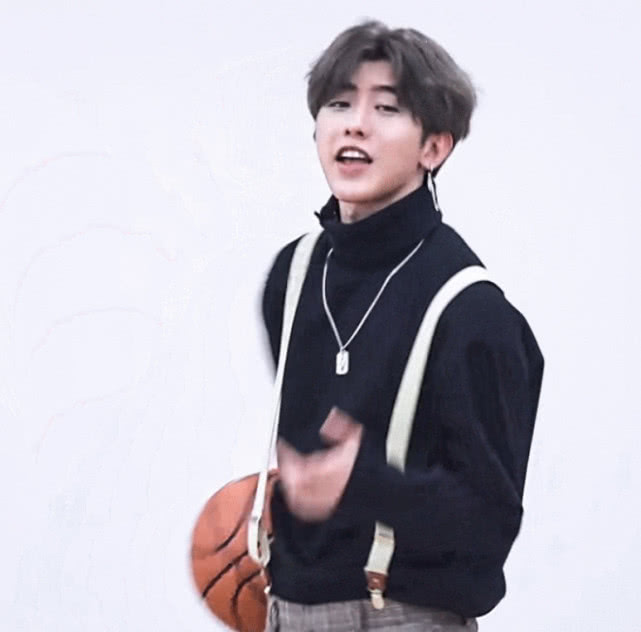

In [1]:
from diffusers.utils import load_image

image = load_image("images/2-4-4-kunkun.png")
image

使用 OpenCV 的边缘检测获取图像的边缘。

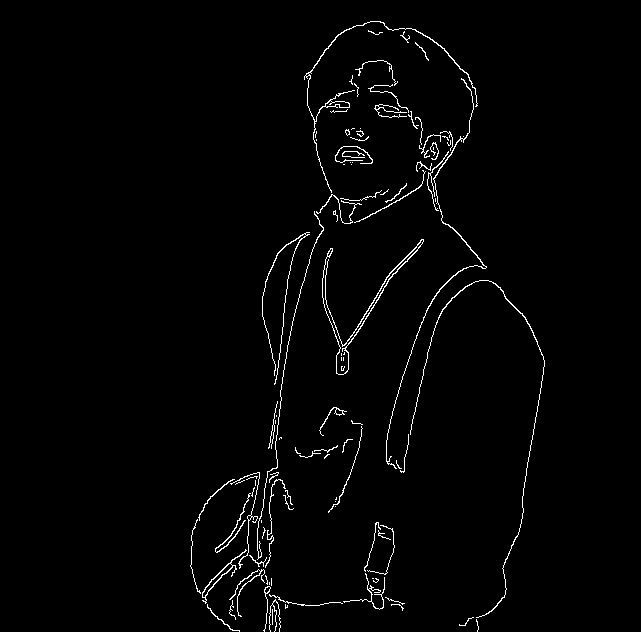

In [2]:
import cv2
from PIL import Image
import numpy as np

image = np.array(image)

low_threshold = 100
high_threshold = 200

image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)
canny_image

### 使用 ControlNet

加载 Stable Diffusion 模型和完成 Canny 边缘控制的 ControlNet。由于 Huggingface 给出的模型是利用 Stable Diffusion v1-5 训练的，因此这里的模型也要选择正确的版本。

In [3]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
import torch

controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-canny",
    torch_dtype=torch.float16,
)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=controlnet,
    torch_dtype=torch.float16,
)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


Stable Diffusion 默认使用 PNDMScheduler 调度器，一般经过 `num_inference_steps=50` 步推理生成图片。我们也可以选择不同的调度器，例如 `DPMSolverSinglestepScheduler` 或 `UniPCMultistepScheduler`，这些经过精心设计的调度器可以在不牺牲太多效果的前提下，只使用 20 步推理生成图像，有关调度器的更多选择可以在[这里](https://huggingface.co/docs/diffusers/main/en/using-diffusers/schedulers)查看。

In [4]:
from diffusers import UniPCMultistepScheduler

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

这里介绍三个有助于降低显存使用量的优化：

* [Smart model offloading](https://huggingface.co/docs/diffusers/optimization/fp16#offloading-to-cpu-with-accelerate-for-memory-savings)：智能 CPU 卸载。众所周知，Stable Diffusion 的推理并不是单个模型的作用，而是需要依次经过 CLIP Text Encoder，UNet，VAE 等模型组件。在扩散过程中，这些组件很可能只需要加载一次，因此不需要从一开始就加载到 GPU 中。因此 Smart model offloading 可以做到在不需要某个模块的时候，将其卸载到 CPU 中。这并不会显著增加推理用时，所需要的额外开销仅仅是模型在 CPU 与 GPU 之间转移的时间而已。
* [xformers](https://github.com/facebookresearch/xformers)：xformers 在注意力层使用了加速，可以降低显存开销，并略微提高推理速度。
* [Sequential attention](https://huggingface.co/docs/diffusers/v0.21.0/en/api/pipelines/stable_diffusion/img2img#diffusers.StableDiffusionImg2ImgPipeline.enable_attention_slicing)：推理过程中，大部分的显存被交叉注意力层占用。`enable_attention_slicing()` 使我们能够按顺序地执行交叉注意力的操作，而不是并行，这在需要并行生成大量图片的时候非常有用。`enable_attention_slicing()` 几乎不会牺牲任何图像生成的质量。

In [5]:
# pipe.enable_model_cpu_offload()
pipe.to("cuda")  # 注意，启用 CPU offload 后，则不再需要 pipe.to("cuda") 的操作
pipe.enable_xformers_memory_efficient_attention()
pipe.enable_attention_slicing()

In [6]:
prompt = ", best quality, extremely detailed"
prompt = [t + prompt for t in ["Kun holding a basketball", "Kun holding a chicken"]]
generator = [torch.Generator(device="cuda").manual_seed(i) for i in range(len(prompt))]

In [7]:
images = pipe(
    prompt * 8,
    canny_image,
    negative_prompt=["monochrome, lowres, bad anatomy, worst quality, low quality"] * 16,
    num_inference_steps=20,
    generator=generator * 8,
).images

  0%|          | 0/20 [00:00<?, ?it/s]

/home/guapiii/anaconda3/envs/pytorch201/lib/python3.10/site-packages/torch/nn/modules/conv.py:459: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1682343995026/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)
  return F.conv2d(input, weight, bias, self.stride,


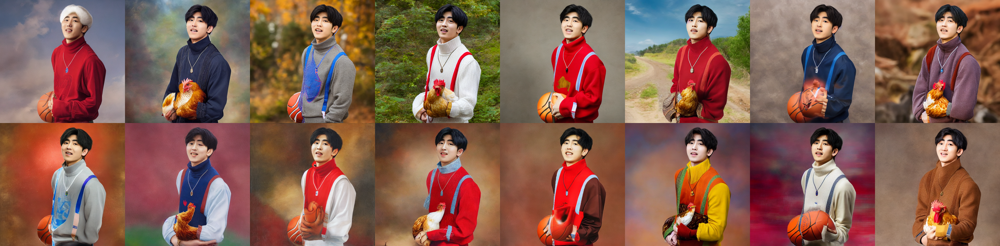

In [8]:
from diffusers.utils import make_image_grid

make_image_grid(images, 2, 8)

### 结合其他微调

我们还能轻松地将 ControlNet 与其他微调后的模型结合使用，以有效利用不同方案各自的优势。例如使用 DreamBooth 对模型进行微调，为模型植入一个概念 `[V]`，然后使用 ControlNet 增加控制信息，将 `[V]` 渲染到不同的场景中。我们所要做的只是加载一个不同的模型而已。

In [ ]:
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "sd-dreambooth-library/mr-potato-head",
    controlnet=controlnet,
    torch_dtype=torch.float16,
)
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_model_cpu_offload()
pipe.enable_xformers_memory_efficient_attention()
pipe.enable_attention_slicing()
generator = torch.Generator(device="cpu").manual_seed(2012)

prompt = "a photo of sks mr potato head, best quality, extremely detailed"
images = pipe(
    prompt,
    canny_image,
    negative_prompt="monochrome, lowres, bad anatomy, worst quality, low quality",
    num_inference_steps=20,
    generator=generator,
).images
images[0]

### 多种约束的结合

ControlNet 所支持的不仅仅是 Canny 约束一种，论文提供了八种不同的约束，这里不一一实验，感兴趣的可以参考 Huggingface 中[作者的仓库](https://huggingface.co/lllyasviel)。接下来探索多种约束的结合：

// TODO: